> Purpose

Produce graphics that show audience about the tropical cyclones (TC) risk for PH. With a focus on TC induced rainfall, rapid intensification, storm surge, and the change in future climate.

> Data source

Track:

IBTRACS

https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/shapefile/IBTrACS.WP.list.v04r01.lines.zip

https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/shapefile/IBTrACS.WP.list.v04r01.points.zip

Rainfall:  

IMERG. https://developers.google.com/earth-engine/datasets/catalog/NASA_GPM_L3_IMERG_V07 (Using band "precipitation".)



# **TC-induced rainfall trend: using IMERG**
3a. Save the total rainfall within target area during each event period.

3b. Get the time series of event total rainfall of all TCs that impacted PH in history.

# **Step 0: Imaport and install library**

In [ ]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 41.0 MB/s eta 0:00:00


In [ ]:
!pip install rasterio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 47.2 MB/s eta 0:00:00


In [ ]:
!pip install pyextremes


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 1.8 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
import xarray as xr
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from datetime import datetime, timedelta
from pathlib import Path
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
import geemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import mapping
from shapely.geometry import Point
from google.colab import files
from matplotlib.colors import LogNorm
import pyextremes
import zipfile
import warnings
warnings.filterwarnings("ignore")

# **Step 1: Initialize Google Earth Engine**

In [ ]:
ee.Authenticate()
ee.Initialize(project='valued-mediator-463106-q8')



# **Step 2: Define paths and constants**

In [ ]:
DATA_DIR = Path("data")
IBTRACS_LINES = "IBTrACS.WP.list.v04r01.lines.shp"
IBTRACS_POINTS = "IBTrACS.WP.list.v04r01.points.shp"
PH_BUFFER_SHAPEFILE = "PHL_1degree_buffer.shp"
PH_LAND_SHAPEFILE = "PHL_adm0.shp"
OUTPUT_DIR = Path("output")
OUTPUT_DIR.mkdir(exist_ok=True)
OUTPUT_DIR2 = Path("output2")
OUTPUT_DIR2.mkdir(exist_ok=True)
START_YEAR = 2014
END_YEAR = 2021

# **Step 3: Load Philippines 1-degree buffer shapefile**

In [ ]:
def load_ph_shapefile():
    """Load Philippines 1-degree buffer shapefile."""
    return gpd.read_file(PH_BUFFER_SHAPEFILE)


# **Step 4: Load Philippines land-only shapefile**

In [ ]:
def load_ph_land_shapefile():
    """Load Philippines land-only shapefile."""
    return gpd.read_file(PH_LAND_SHAPEFILE).to_crs(epsg=4326)


# **Step 5: Load IBTrACS shapefiles and filter for Philippines and 2000-2025**

In [ ]:
def load_ibtracs(ph_shp):
    lines = gpd.read_file(IBTRACS_LINES)
    points = gpd.read_file(IBTRACS_POINTS)

    # Convert ISO_TIME to datetime
    points["ISO_TIME"] = pd.to_datetime(points["ISO_TIME"])

    # Filter for 2024-2025
    points = points[(points["ISO_TIME"].dt.year >= START_YEAR) &
                    (points["ISO_TIME"].dt.year <= END_YEAR)]

    # Filter for Philippines using shapefile
    ph_lines = lines[lines.intersects(ph_shp.unary_union)]
    ph_points = points[points.intersects(ph_shp.unary_union)]

    return ph_lines, ph_points


# **Step 6: Group points by storm ID and get event periods**

In [ ]:
def get_tc_events(points):
    events = []
    for sid in points["SID"].unique():
        storm_points = points[points["SID"] == sid]
        start_time = storm_points["ISO_TIME"].min()
        end_time = storm_points["ISO_TIME"].max()
        events.append({
            "SID": sid,
            "NAME": storm_points["NAME"].iloc[0],
            "START_TIME": start_time,
            "END_TIME": end_time,
        })
    return pd.DataFrame(events)



# **Step 7: Fetch IMERG precipitation for a TC event period**

In [ ]:
def get_imerg_rainfall(start_time, end_time):
    imerg = ee.ImageCollection("NASA/GPM_L3/IMERG_V07").filterDate(
        start_time.strftime("%Y-%m-%d"),
        (end_time + timedelta(days=1)).strftime("%Y-%m-%d")
    ).select("precipitation")

    # Sum precipitation over the period (mm/hr to total mm)
    total_rain = imerg.sum().multiply(0.5)  # 30-min intervals to hourly
    return total_rain


# **Step 8: Clip IMERG image to Philippines shapefile**

In [ ]:
def clip_to_philippines(image, ph_shp_ee):
    return image.clip(ph_shp_ee)


# **Calculate and save grid-specific rainfall for TC event within buffer**

In [ ]:
def export_rainfall_per_grid(rainfall, sid, name, output_path, ph_shp_ee, ph_shp, ph_land, lines, start_time, end_time):
    """
    Export rainfall data for each grid cell during the period a TC is within the buffer.
    Appends data for each TC to existing grid cell CSVs or creates new ones.

    Parameters:
    - rainfall: ee.Image with rainfall data
    - sid: Storm ID
    - name: Storm name
    - output_path: Path to save output CSVs
    - ph_shp_ee: Earth Engine geometry for the Philippines
    - ph_shp: Geopandas GeoDataFrame for the Philippines
    - ph_land: Geopandas GeoDataFrame for land areas
    - lines: Geopandas GeoDataFrame with TC tracks
    - start_time: Time when TC enters the buffer (ISO format)
    - end_time: Time when TC exits the buffer (ISO format)
    """
    # Ensure output path exists
    output_path = Path(output_path)
    output_path.mkdir(parents=True, exist_ok=True)

    # Export rainfall to temporary GeoTIFF
    temp_tif = output_path / f"temp_grid_{sid}.tif"
    geemap.ee_export_image(rainfall, filename=str(temp_tif),
                           region=ph_shp_ee, scale=11132)

    # Mask rainfall to land-only areas
    with rasterio.open(temp_tif) as src:
        ph_land_geom = [mapping(geom) for geom in ph_land.geometry]
        masked_rainfall, masked_transform = mask(src, ph_land_geom, crop=True, nodata=np.nan)

    rainfall_mm = masked_rainfall[0]  # 2D array of rainfall values in mm
    valid_pixels = ~np.isnan(rainfall_mm)  # Mask for non-NaN (land) pixels

    num_grids_processed = 0
    if np.any(valid_pixels):
        # Get pixel coordinates
        rows, cols = np.where(valid_pixels)
        # Convert pixel indices to geographic coordinates
        lon, lat = rasterio.transform.xy(masked_transform, rows, cols)
        # Extract rainfall values for valid pixels
        rainfall_values = rainfall_mm[valid_pixels]

        # Process each grid cell
        for lon_val, lat_val, rain_val in zip(lon, lat, rainfall_values):

            lon_formatted = f"{lon_val:.16f}"
            lat_formatted = f"{lat_val:.16f}"
            # Create grid_key with formatted coordinates
            grid_key = f"{lon_formatted}_{lat_formatted}"
            csv_filename = output_path / f"{grid_key}.csv"

            # Create DataFrame for the current TC's data
            new_data = pd.DataFrame([{
                "Start_time": start_time,
                "End_time": end_time,
                "SID": sid,
                "Name": name,
                "Longitude": lon_formatted,
                "Latitude": lat_formatted,
                "Rainfall_mm": rain_val

            }])

            # Check if CSV already exists
            if csv_filename.exists():
                # Read existing CSV and append new data
                existing_data = pd.read_csv(csv_filename)
                updated_data = pd.concat([existing_data, new_data], ignore_index=True)
                updated_data.to_csv(csv_filename, index=False)
                print(f"Appended TC {name} ({sid}) data to {csv_filename}")
            else:
                # Create new CSV
                new_data.to_csv(csv_filename, index=False)
                print(f"Created new CSV for grid {grid_key} with TC {name} ({sid}) data")

            num_grids_processed += 1

    # Clean up temporary GeoTIFF
    if temp_tif.exists():
        temp_tif.unlink()

    return num_grids_processed  # Return number of grids processed

# **Step 9: Export rainfall distribution map with TC route, Philippines boundary, and custom colormap**

In [ ]:
def export_rainfall_map(rainfall, sid, name, output_path, ph_shp_ee, ph_shp, ph_land, lines, start_time, end_time):
    # Export rainfall to temporary GeoTIFF
    temp_tif = output_path / f"temp_{sid}.tif"
    geemap.ee_export_image(rainfall, filename=str(temp_tif),
                           region=ph_shp_ee, scale=11132)

    # Mask rainfall to land-only areas
    with rasterio.open(temp_tif) as src:
        ph_land_geom = [mapping(geom) for geom in ph_land.geometry]
        masked_rainfall, masked_transform = mask(src, ph_land_geom, crop=True, nodata=np.nan)

    pixel_area_m2 = 11132 * 11132  # IMERG scale: 11132 m x 11132 m per pixel

    rainfall_mm = masked_rainfall[0]  # 2D array of rainfall values in mm
    valid_pixels = ~np.isnan(rainfall_mm)  # Mask for non-NaN (land) pixels
    total_rainfall_m3 = np.sum(rainfall_mm[valid_pixels] * pixel_area_m2) / 1000  # Σ [Rainfall (mm) × Area (m²)] / 1000
    total_area_m2 = np.sum(valid_pixels) * pixel_area_m2  # Total area of valid pixels
    avg_rainfall_mm = (total_rainfall_m3 * 1000) / total_area_m2 if total_area_m2 > 0 else 0  # Total Volume (m³) × 1000 / Total Area (m²)

    # Save pixel-level rainfall data to CSV
    if np.any(valid_pixels):
        # Get pixel coordinates
        rows, cols = np.where(valid_pixels)
        # Convert pixel indices to geographic coordinates
        lon, lat = rasterio.transform.xy(masked_transform, rows, cols)
        # Extract rainfall values for valid pixels
        rainfall_values = rainfall_mm[valid_pixels]
        # Create DataFrame with pixel data
        pixel_data = pd.DataFrame({
            "Longitude": lon,
            "Latitude": lat,
            "Rainfall": rainfall_values,
            "Start_time": start_time,
            "End_time":  end_time
        })
        # Save to CSV
        pixel_data.to_csv(output_path / f"Rainfall_{sid}.csv", index=False, float_format='%.16f')

    # Print results for verification
    # print(f"Total rainfall volume for TC {name} ({sid}) from Rainfall Distribution Map: {total_rainfall_m3:.2f} m³")
    # print(f"Average rainfall for TC {name} ({sid}) from Rainfall Distribution Map: {avg_rainfall_mm:.2f} mm")

    # Get TC route for this SID
    tc_route = lines[lines["SID"] == sid]


    '''
    # Define custom colormap
    colors = [
        "#FFFFFF",         # 0 mm
        "#00CED1",       # 1-10 mm
        "#3a5f3a",       # 10-20 mm
        "#73be73",        # 20-30 mm
        "#90ee90",       # 30-40 mm
        "#FF4500",        # 40-50 mm
        "#F0A040",            # 50-70 mm
        "#D07040",        # 70-100 mm
        "#A05050",       # 100-140 mm
        "#803080",    # 140-200 mm
        "#A040A0",          # 200-300 mm
        "#C080C0",      # 300-400 mm
        "#D0A0D0",          # 400-500 mm
        "#E0C0E0",       # 500-600 mm
        "#F0E0F0"        # >600 mm
    ]
    bounds = [0, 1, 10, 20, 30, 40, 50, 70, 100, 140, 200, 300, 400, 500, 600, 1000]
    color_names = [ #ignore this
        "White", "Light blue", "Green", "Light green", "Lighter green", "Yellow",
        "Orange", "Light red", "Dark red", "Dark purple", "Light purple",
        "Dark pink", "Light pink", "Light violet", "Dark violet"
    ]
    labels = [f"{int(bounds[i])}–{int(bounds[i+1])} mm" if i < len(bounds)-2
              else f">600 mm" if i == len(bounds)-2
              else "" for i in range(len(bounds)-1)]
    cmap = mcolors.ListedColormap(colors)
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # Create map using Cartopy
    fig = plt.figure(figsize=(20, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Set extent to Philippines buffer
    bounds_shp = ph_shp.total_bounds  # [minx, miny, maxx, maxy]
    ax.set_extent([bounds_shp[0], bounds_shp[2], bounds_shp[1], bounds_shp[3]], crs=ccrs.PlateCarree())

    # Plot masked rainfall
    rainfall_img = ax.imshow(masked_rainfall[0], origin="upper", transform=ccrs.PlateCarree(),
                             extent=[masked_transform[2], masked_transform[2] + masked_rainfall.shape[2] * masked_transform[0],
                                     masked_transform[5] + masked_rainfall.shape[1] * masked_transform[4], masked_transform[5]],
                             cmap=cmap, norm=norm)

    # Add custom colorbar
    cbar = plt.colorbar(rainfall_img, ax=ax, label="Rainfall", shrink=0.6, ticks=[(bounds[i] + bounds[i+1])/2 for i in range(len(bounds)-1)])
    cbar.ax.set_yticklabels(labels, rotation=45, ha="right", va="center", fontsize=8)
    cbar.set_label("Rainfall", fontsize=10)

    # Plot Philippines boundary
    # ph_shp.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=1.5, transform=ccrs.PlateCarree())

    # Plot TC route
    if not tc_route.empty:
        tc_route.plot(ax=ax, color="red", linewidth=2, transform=ccrs.PlateCarree())

    # Add coastlines and gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.gridlines(draw_labels=True, linestyle="--", alpha=0.5)

    # Set title
    ax.set_title(f"TC {name} ({sid}) Rainfall (mm)")

    # Save and download the map
    map_filename = output_path / f"rainfall_map_{sid}.png"
    plt.savefig(map_filename, dpi=300, bbox_inches="tight")
    # files.download(map_filename)
    plt.close()
    temp_tif.unlink()'''

    return total_rainfall_m3, avg_rainfall_mm


# **Step 10:Calculate maximum rainfall over Philippines for an event**

In [ ]:
def calculate_max_rainfall(rainfall, ph_shp_ee):
    stats = rainfall.reduceRegion(
        reducer=ee.Reducer.max(), geometry=ph_shp_ee, scale=11132
    ).getInfo()
    return stats.get("precipitation", 0)


# **Step 11: Main Function**

# **Generate Rainfall Distribution map + aslo a CSV with each SID, each csv contain each pixel total rainfall in impacting hour + Generate a CSV with each grid name its long+lat, each csv contain each Tc rainfall in each grid**

below function need 20 mins to run all the tc, so wait and dont panic

Also, it will download the map automactically so please check you have enough space to contain all 360+ tc map

In [ ]:
def main():
    # Load Philippines shapefiles
    print("Loading Philippines shapefiles...")
    ph_shp = load_ph_shapefile()
    ph_land = load_ph_land_shapefile()

    # Convert buffer shapefile to EE geometry
    ph_coords = ph_shp.geometry.unary_union.__geo_interface__["coordinates"]
    ph_shp_ee = ee.Geometry.Polygon(ph_coords)

    # Load IBTrACS data
    print("Loading IBTrACS data...")
    ph_lines, ph_points = load_ibtracs(ph_shp)

    # Get TC events
    print("Identifying TC events...")
    events = get_tc_events(ph_points)

    # Initialize results for time series (3b) and maximum rainfall (3a)
    total_rainfall_series = []
    max_rainfall_series = []


    # Process each TC event
    for _, event in events.iterrows():
        sid = event["SID"]
        name = event["NAME"]
        start_time = event["START_TIME"]
        end_time = event["END_TIME"]
        print(f"Processing TC {name} ({sid})...")

        # Calculate impacting hours (time within 1-degree buffer)
        storm_points = ph_points[ph_points["SID"] == sid]
        if not storm_points.empty:
            impact_start = storm_points["ISO_TIME"].min()
            impact_end = storm_points["ISO_TIME"].max()
            impacting_hours = (impact_end - impact_start).total_seconds() / 3600.0
            impacting_hours = max(impacting_hours, 1.0)  # Avoid division by zero
        else:
            print(f"Warning: No points found for {sid} within buffer. Skipping...")
            continue


        # Get IMERG rainfall
        rainfall = get_imerg_rainfall(start_time, end_time)
        rainfall = clip_to_philippines(rainfall, ph_shp_ee)

        print(f"Generating rainfall map and calculating total rainfall for {sid}...")
        total_rainfall_m3, avg_rainfall_mm = export_rainfall_map(rainfall, sid, name, OUTPUT_DIR, ph_shp_ee, ph_shp, ph_land, ph_lines, start_time, end_time)
        '''
        # Export rainfall per grid cell
        print(f"Exporting rainfall per grid for {sid}...")
        num_grids = export_rainfall_per_grid(
            rainfall, sid, name, OUTPUT_DIR, ph_shp_ee, ph_shp, ph_land, ph_lines, start_time, end_time
        )
        print(f"Processed {num_grids} grid cells for TC {name} ({sid})")'''
        '''
        total_rainfall_series.append({
            "SID": sid,
            "NAME": name,
            "START_TIME": start_time,
            "IMPACTING_HOURS": impacting_hours,
            "TOTAL_RAINFALL_VOLUME_M3": total_rainfall_m3,
            "AVERAGE_RAINFALL_MM": avg_rainfall_mm

        })

        max_rainfall_mm = calculate_max_rainfall(rainfall, ph_shp_ee)
        max_rainfall_series.append({
            "SID": sid,
            "NAME": name,
            "START_TIME": start_time,
            "END_TIME": end_time,
            "MAX_RAINFALL_MM": max_rainfall_mm
        })'''


    '''
    total_rainfall_df = pd.DataFrame(total_rainfall_series)
    total_rainfall_df.to_csv(OUTPUT_DIR / "tc_event_total_rainfall.csv", index=False)

    max_rainfall_series_df = pd.DataFrame(max_rainfall_series)
    max_rainfall_series_df.to_csv(OUTPUT_DIR / "tc_max_rainfall_series.csv", index=False)
    '''

    '''
    # Plot total rainfall volume from 2000-2024
    plt.figure(figsize=(12, 6))
    plt.bar(total_rainfall_df["NAME"], total_rainfall_df["TOTAL_RAINFALL_VOLUME_M3"], color="skyblue")
    plt.title("Total Rainfall Volume per TC Event in Philippines (2000-2024)")
    plt.xlabel("Tropical Cyclone")
    plt.ylabel("Total Rainfall Volume (m³)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_event_total_rainfall_volume.png", dpi=300)
    plt.close()

    # then Plot average rainfall from 2000-2024
    plt.figure(figsize=(12, 6))
    plt.bar(total_rainfall_df["NAME"], total_rainfall_df["AVERAGE_RAINFALL_MM"], color="lightgreen")
    plt.title("Average Rainfall per TC Event in Philippines (2000-2024)")
    plt.xlabel("Tropical Cyclone")
    plt.ylabel("Average Rainfall (mm)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_event_average_rainfall.png", dpi=300)
    plt.close()

    # find the average rainfall (mm) for each 5-year period from 2000 to 2024
    total_rainfall_df["YEAR"] = total_rainfall_df["START_TIME"].dt.year
    periods = [(2000, 2004), (2005, 2009), (2010, 2014), (2015, 2019), (2020, 2024)]
    period_data = []

    for start_year, end_year in periods:
        period_df = total_rainfall_df[(total_rainfall_df["YEAR"] >= start_year) &
                                     (total_rainfall_df["YEAR"] <= end_year)]
        avg_rainfall = period_df["AVERAGE_RAINFALL_MM"].mean() if not period_df.empty else 0
        period_data.append({
            "PERIOD": f"{start_year}-{end_year}",
            "AVG_RAINFALL_MM": avg_rainfall
        })

    period_df = pd.DataFrame(period_data)
    period_df.to_csv(OUTPUT_DIR / "tc_avg_rainfall_5year_periods.csv", index=False)

    plt.figure(figsize=(10, 6))
    plt.bar(period_df["PERIOD"], period_df["AVG_RAINFALL_MM"], color="lightgreen")
    plt.title("Average Rainfall per 5-Year Period in Philippines (2000-2024)")
    plt.xlabel("Period")
    plt.ylabel("Average Rainfall (mm)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_avg_rainfall_5year_periods.png", dpi=300)
    plt.close()

    # Calculate total rainfall per each year (2000-2025)
    yearly_rainfall = total_rainfall_df.groupby("YEAR")["AVERAGE_RAINFALL_MM"].sum().reset_index()
    yearly_rainfall = yearly_rainfall.sort_values("YEAR")
    yearly_rainfall.to_csv(OUTPUT_DIR / "tc_total_rainfall_per_year.csv", index=False)

    plt.figure(figsize=(12, 6))
    plt.bar(yearly_rainfall["YEAR"].astype(str), yearly_rainfall["AVERAGE_RAINFALL_MM"], color="lightblue")
    plt.title("Total Rainfall per Year caused by TCs in Philippines (2000-2024)")
    plt.xlabel("Year")
    plt.ylabel("Total Rainfall (m³)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.show()
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "tc_total_rainfall_per_year.png", dpi=300)
    plt.close()


    # Maximum Rainfall per TC Event in Philippines (2000-2025)
    max_rainfall_df = pd.DataFrame(max_rainfall_series)
    max_rainfall_df.to_csv(OUTPUT_DIR / "tc_rainfall_max_time_series.csv", index=False)

    plt.figure(figsize=(12, 6))
    plt.bar(max_rainfall_df["NAME"], max_rainfall_df["MAX_RAINFALL_MM"], color="lightcoral")
    plt.title("Maximum Rainfall per TC Event in Philippines (2000-2024)")
    plt.xlabel("Tropical Cyclone")
    plt.ylabel("Maximum Rainfall (mm)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_rainfall_max_time_series.png", dpi=300)
    plt.close()

    print("Analysis complete. Outputs saved in:", OUTPUT_DIR)'''


if __name__ == "__main__":
    main()

Loading Philippines shapefiles...
Loading IBTrACS data...
Identifying TC events...
Processing TC KAJIKI (2014029N10143)...
Generating rainfall map and calculating total rainfall for 2014029N10143...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2014029N10143.tif
Processing TC UNNAMED (2014080N08128)...
Generating rainfall map and calculating total rainfall for 2014080N08128...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2014080N08128.tif
Processing TC RAMMASUN (2014190N08154)...
Generating rainfall map and calculating total rainfall for 2014190N08154...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2014190N08154.tif
Processing TC KALMAEGI (2014254N10142)...
Generating rainfall map and calculating total rainfall for 2014254N10142...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2014254N10142.tif
Processing TC FUNG-WONG (2014260N13135)...
Generating rainfall map and calcu

# **Zip all the output to download it easyily**

In [ ]:
def zip_csv_files(output_path):
    """
    Zip all CSV files in the output directory  .

    Parameters:
    - output_path: Path object to the directory containing CSV files
    """
    zip_filename = output_path / f"00Rainfall_GRID_Data.zip"

    # Find all CSV files in the output directory
    csv_files = list(output_path.glob("*.csv"))

    if not csv_files:
        print(f"No CSV files found in {output_path} for TC. Skipping zipping.")
        return

    # Create a zip file and add all CSVs
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for csv_file in csv_files:
            zipf.write(csv_file, arcname=csv_file.name)
            print(f"Added {csv_file.name} to {zip_filename}")

    print(f"Created zip file: {zip_filename}")

In [ ]:
zip_csv_files(OUTPUT_DIR)

Added Rainfall_2020288N13124.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2020312N10131.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2017284N15134.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2016211N11128.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2019329N09160.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2016288N06146.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2019302N11118.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2017236N15129.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2017364N07138.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2020313N08135.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2019314N14136.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2019242N18126.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2015183N13130.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2018039N08151.csv to output/00Rainfall_GRID_Data.zip
Added Rainfall_2017161N13119.csv to output/00Rai

# **Step 12: using Peaks Over Threshold to perform Extreme value analysis of IMERG rainfall at grid level. Maps of rainfall at return levels 25 year, 50 years, 100 years and 250 years.**

In [ ]:
'''# Define return periods (in years)
return_periods = [25, 50, 100, 250]

grid_data = {
    "Longitude": [],
    "Latitude": [],
    "Return_25yr": [],
    "Return_50yr": [],
    "Return_100yr": [],
    "Return_250yr": []
}

csv_files = list(OUTPUT_DIR.glob("*_*.csv"))  # Matches long_lat.csv pattern

for csv_file in csv_files:
    # Extract longitude and latitude from filename
    lon_str, lat_str = csv_file.stem.split("_")
    lon, lat = float(lon_str), float(lat_str)

    # Read CSV
    df = pd.read_csv(csv_file)
    rainfall = df["Rainfall"].dropna()

    # Skip if insufficient data
    if len(rainfall) < 10:  # Minimum data points for POT
        print(f"Skipping {csv_file}: insufficient data ({len(rainfall)} points)")
        continue

    try:
        df = pd.read_csv(csv_file)
        # Ensure Start_time is in datetime format
        df["Start_time"] = pd.to_datetime(df["Start_time"], errors="coerce")
        # Drop rows with invalid datetime or NaN rainfall
        df = df.dropna(subset=["Start_time", "Rainfall"])

        # Skip if insufficient data
        if len(df) < 10:  # Minimum data points for POT
            print(f"Skipping {csv_file}: insufficient data ({len(df)} points)")
            continue

        # Set Start_time as index
        rainfall_series = df.set_index("Start_time")["Rainfall"]

        # Set up POT model
        model = pyextremes.EVA(data=rainfall)
        model.get_extremes(
            method="POT",
            threshold=np.percentile(rainfall, 95),  # 95th percentile threshold
            r="24H"  # De-clustering to avoid temporal dependence
        )

        # Fit model using Generalized Pareto Distribution
        model.fit_model(model="EmGPD")

        # Calculate return levels
        return_levels = model.get_return_values(
            return_periods=return_periods,
            return_period_size="1Y"
        )

        # Store data
        grid_data["Longitude"].append(lon)
        grid_data["Latitude"].append(lat)
        grid_data["Return_25yr"].append(return_levels[0])
        grid_data["Return_50yr"].append(return_levels[1])
        grid_data["Return_100yr"].append(return_levels[2])
        grid_data["Return_250yr"].append(return_levels[3])

        print(f"Processed {csv_file}: Return levels - 25yr: {return_levels[0]:.2f} mm, "
              f"50yr: {return_levels[1]:.2f} mm, 100yr: {return_levels[2]:.2f} mm, 250yr: {return_levels[3]:.2f} mm")

    except Exception as e:
        print(f"Error processing {csv_file}: {str(e)}")
        continue

# Create GeoDataFrame for mapping
geometry = [Point(lon, lat) for lon, lat in zip(grid_data["Longitude"], grid_data["Latitude"])]
gdf = gpd.GeoDataFrame(
    grid_data,
    geometry=geometry,
    crs="EPSG:4326"
)

# Check if GeoDataFrame is empty
if gdf.empty:
    print("No valid data to create maps. Exiting.")
    exit()

# Plot maps for each return period
for period in return_periods:
    fig, ax = plt.subplots(figsize=(10, 8))

    # Plot return level data
    scatter = gdf.plot(
        column=f"Return_{period}yr",
        ax=ax,
        legend=True,
        cmap="viridis",
        norm=LogNorm(vmin=gdf[f"Return_{period}yr"].min(), vmax=gdf[f"Return_{period}yr"].max()),
        legend_kwds={"label": f"Rainfall (mm) for {period}-Year Return Period"}
    )

    # Add title and labels
    plt.title(f"Extreme Rainfall for {period}-Year Return Period")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

    # Save map
    map_filename = OUTPUT_DIR2 / f"Rainfall_Return_{period}yr.png"
    plt.savefig(map_filename, dpi=300, bbox_inches="tight")
    plt.close()
    print(f"Saved map: {map_filename}")

print("Extreme value analysis and map generation completed.")'''


'# Define return periods (in years)\nreturn_periods = [25, 50, 100, 250]\n\ngrid_data = {\n    "Longitude": [],\n    "Latitude": [],\n    "Return_25yr": [],\n    "Return_50yr": [],\n    "Return_100yr": [],\n    "Return_250yr": []\n}\n\ncsv_files = list(OUTPUT_DIR.glob("*_*.csv"))  # Matches long_lat.csv pattern\n\nfor csv_file in csv_files:\n    # Extract longitude and latitude from filename\n    lon_str, lat_str = csv_file.stem.split("_")\n    lon, lat = float(lon_str), float(lat_str)\n\n    # Read CSV\n    df = pd.read_csv(csv_file)\n    rainfall = df["Rainfall"].dropna()\n\n    # Skip if insufficient data\n    if len(rainfall) < 10:  # Minimum data points for POT\n        print(f"Skipping {csv_file}: insufficient data ({len(rainfall)} points)")\n        continue\n\n    try:\n        df = pd.read_csv(csv_file)\n        # Ensure Start_time is in datetime format\n        df["Start_time"] = pd.to_datetime(df["Start_time"], errors="coerce")\n        # Drop rows with invalid datetime or N

# **Result: Total Rainfall per Year caused by TCs in Philippines**

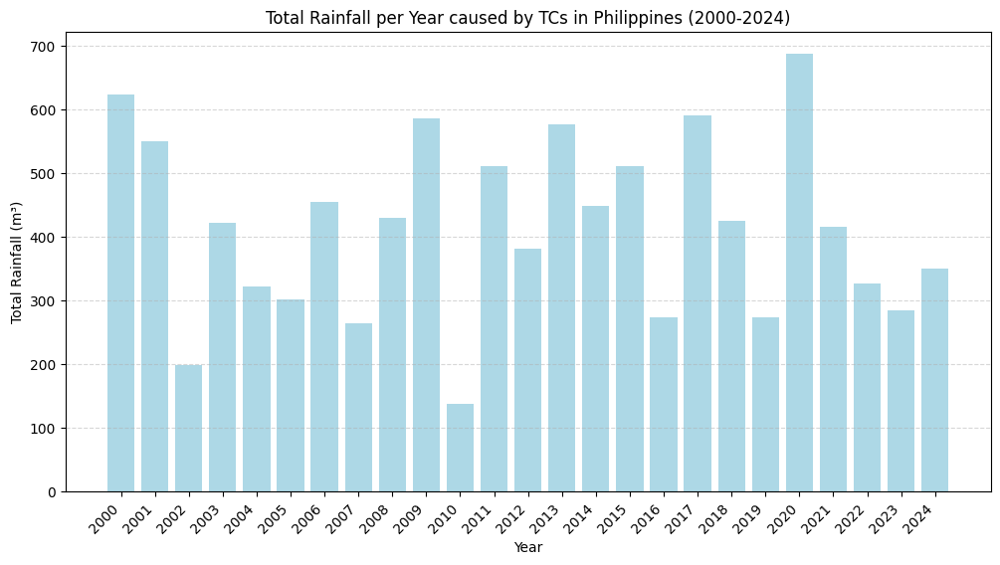

# **Result: Average Rainfall per 5-Year Period in Philippines**

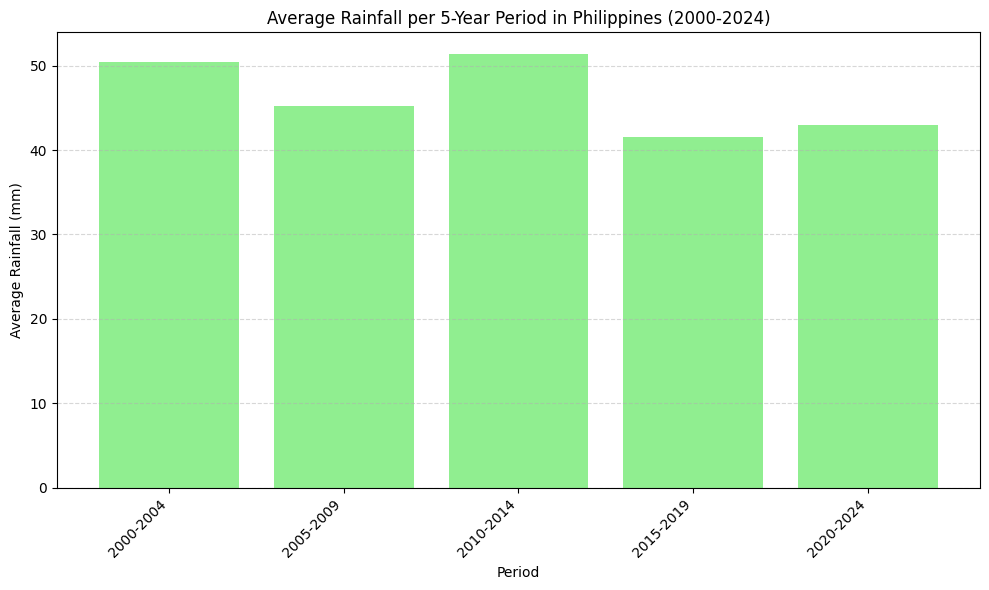

# **Result: Total Rainfall Volume per TC event in Philippines from 2020 to 2024**

x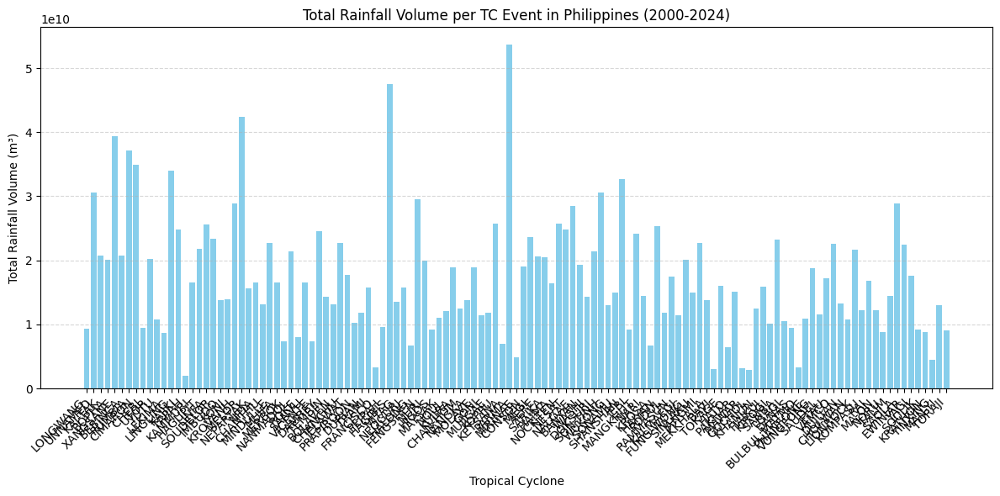

# **Result: Total Rainfall per TC Event in Philippines from 2000 to 2024**





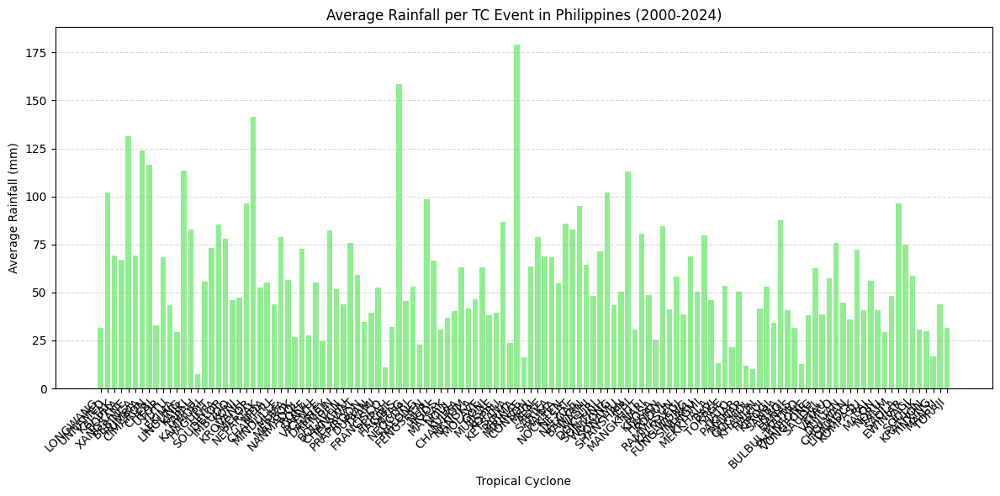

Highest total Rainfall caused by TC in Philippines: 2009270N10148 PARMA 179.18mm

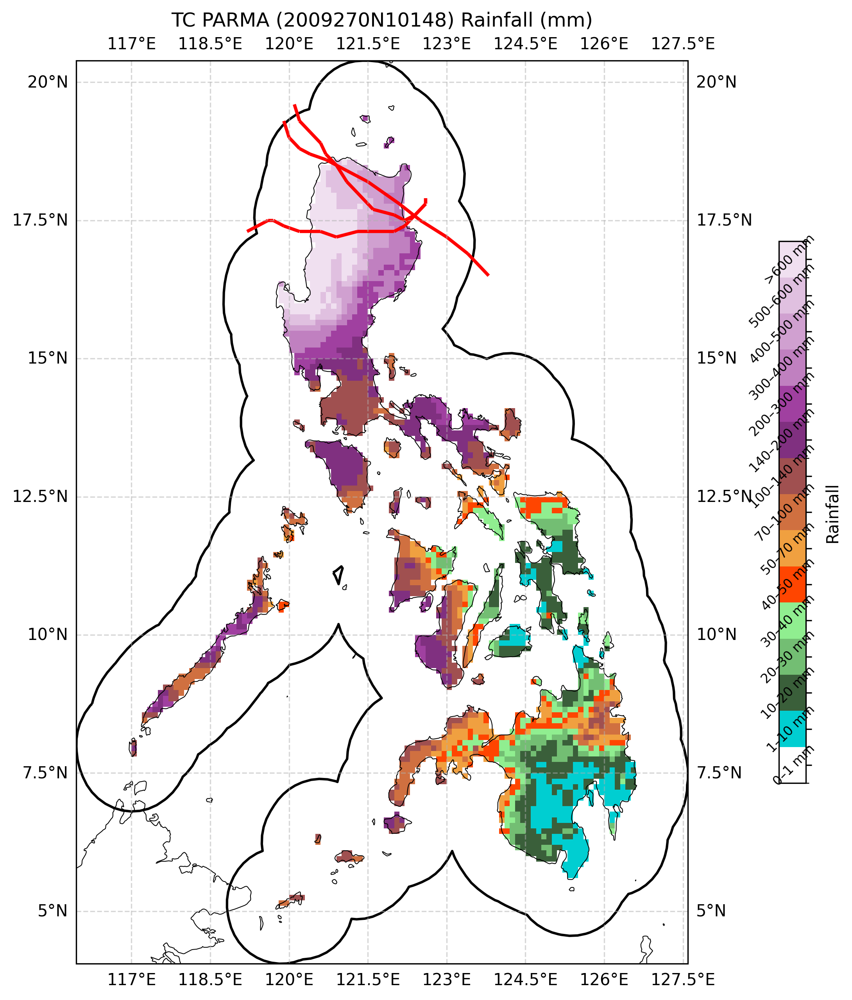

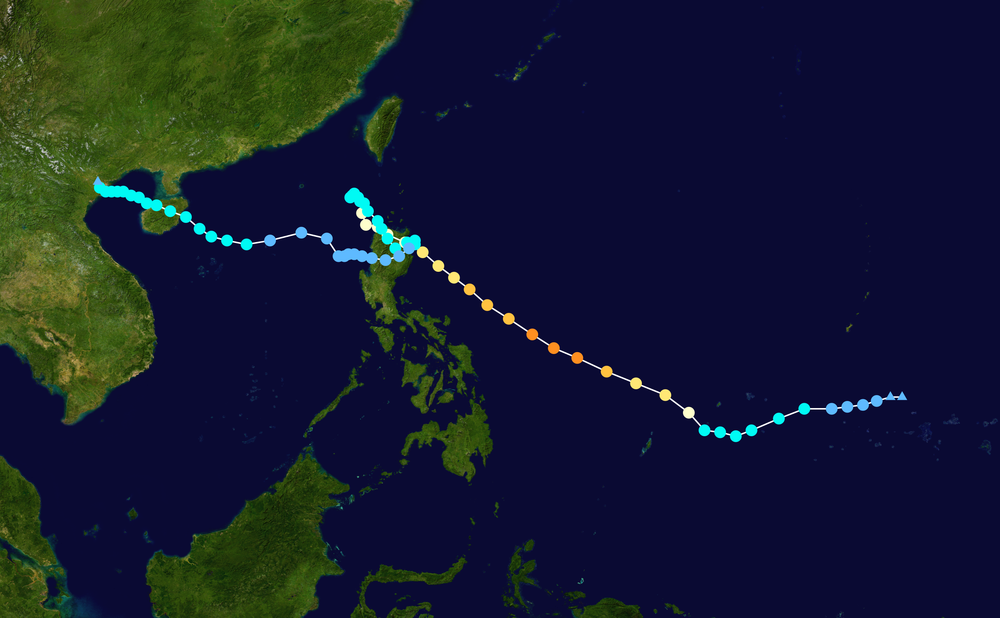

# **Result: Maximum Rainfall per TC Event in Philippines from 2000 to 2024**

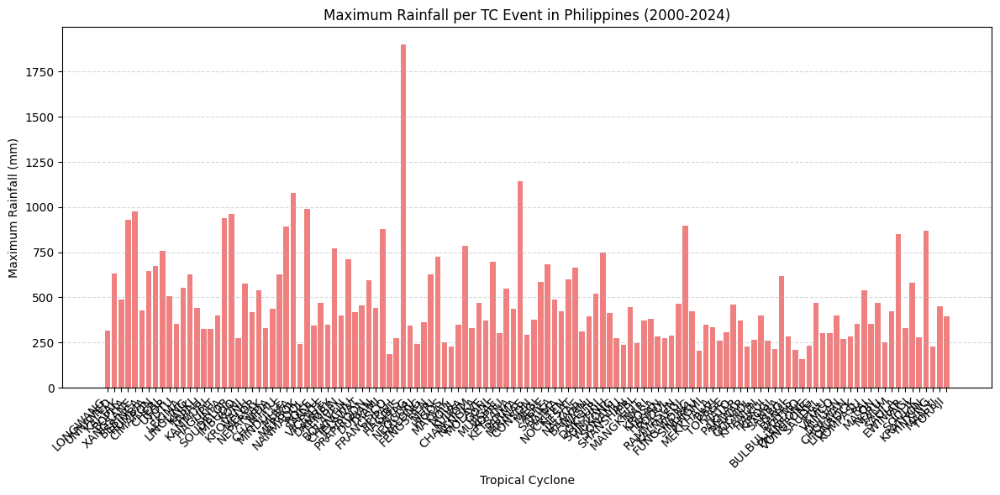

Maximum Rainfall caused by TC Event in Philippines in an hour: 2007323N09128	HAGIBIS 1901mm

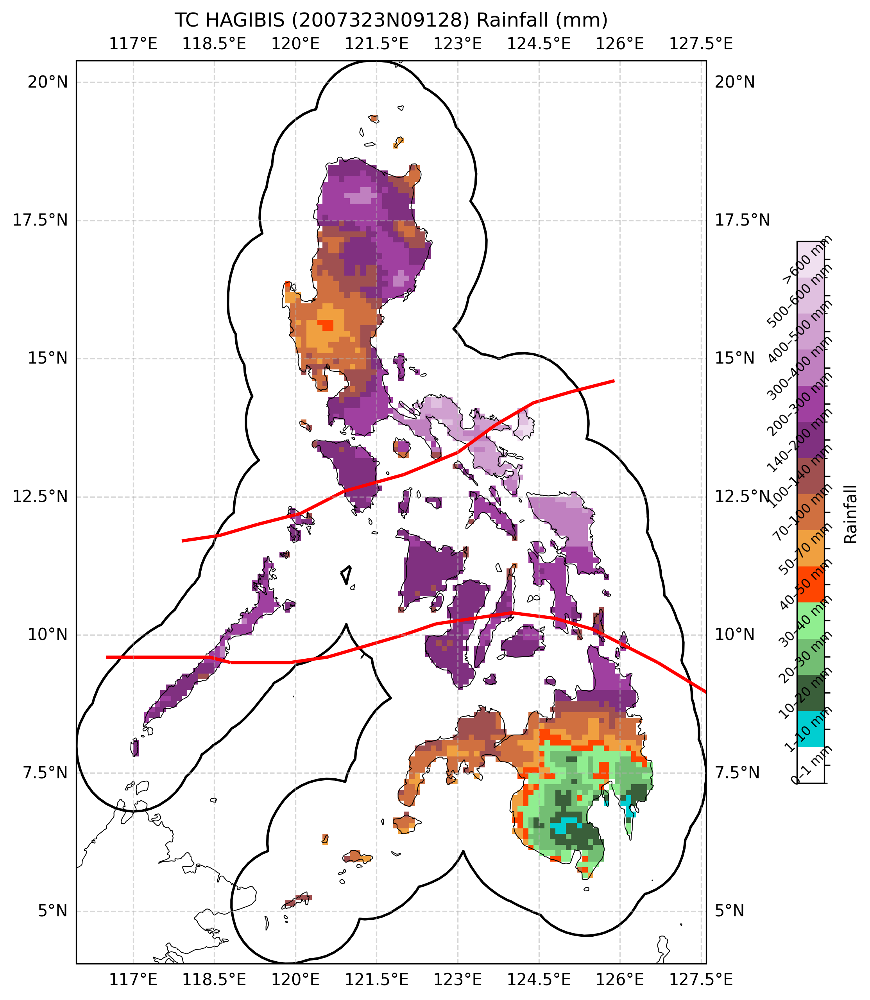

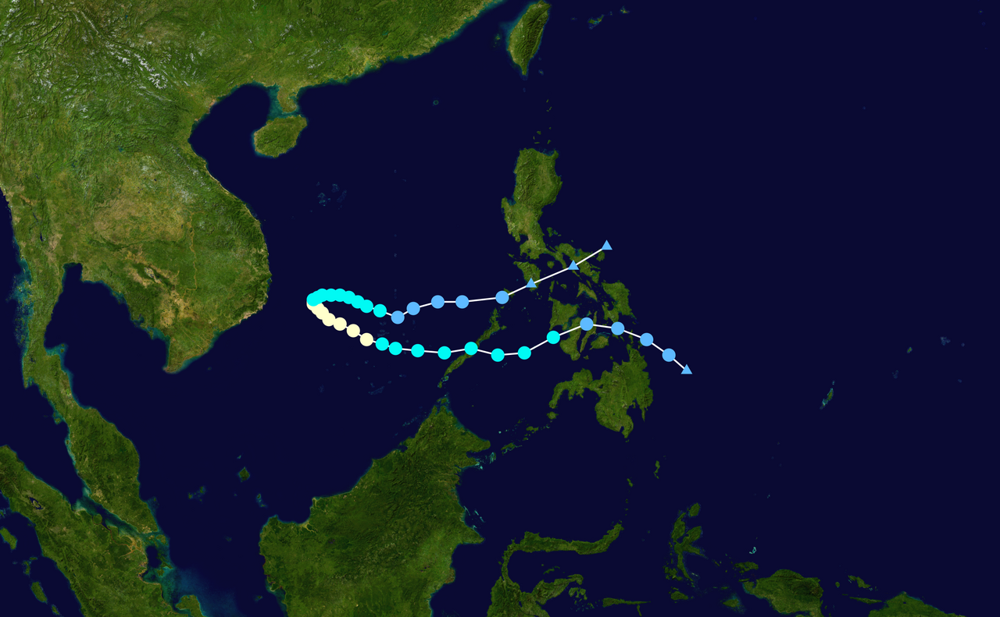

# **FunFact and Reference**

Rainfall Label Reference:

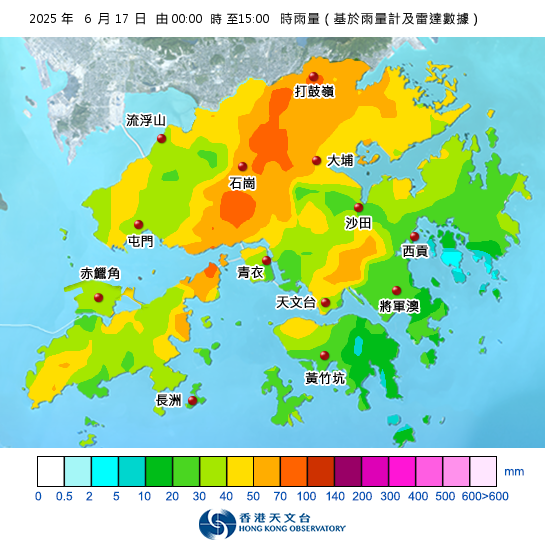

Yagi, passing through the Philippines as a tropical storm on September 1, but combined with the effects of the southwest monsoon, it caused flooding in Metro Manila, and in the provinces of Bulacan, Camarines Norte, Camarines Sur, Cavite, Laguna, Northern Samar, Pangasinan, and Rizal.

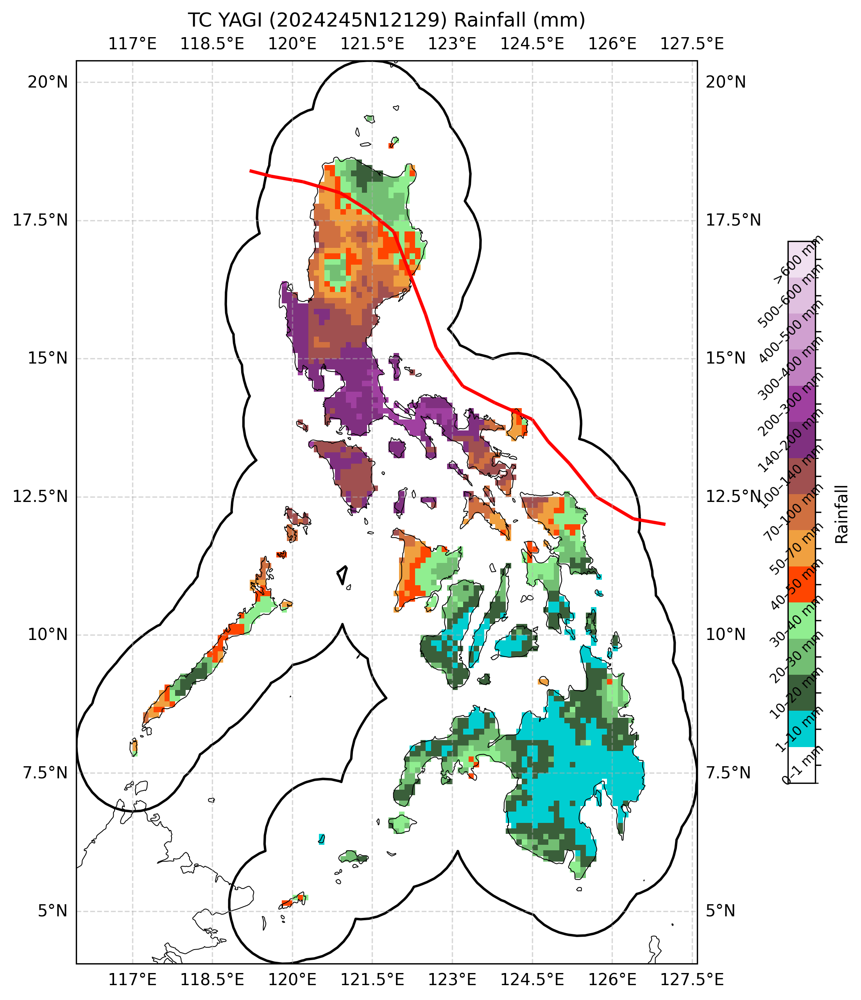

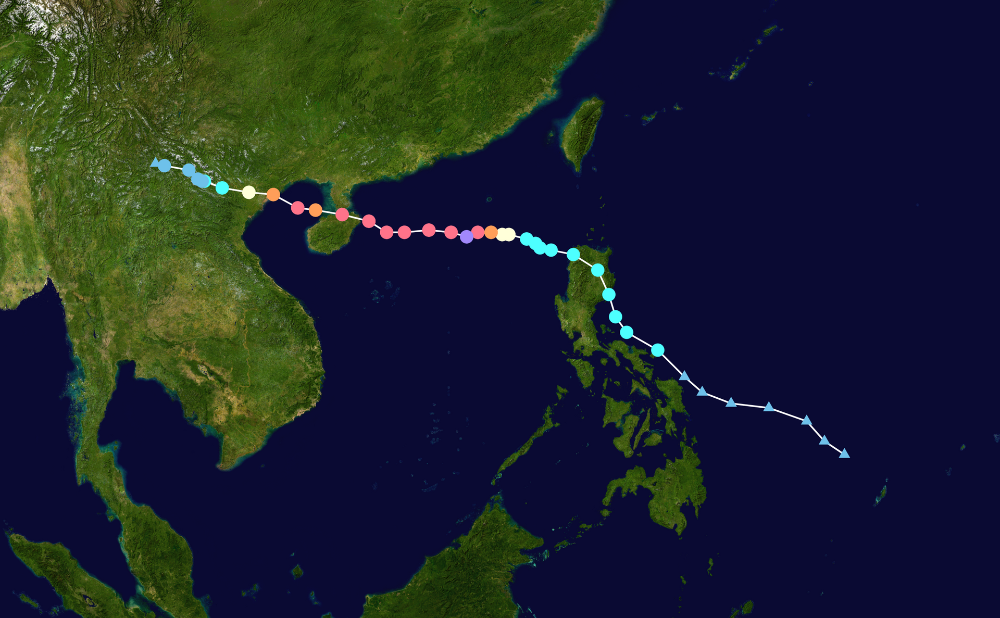

Philippines Map

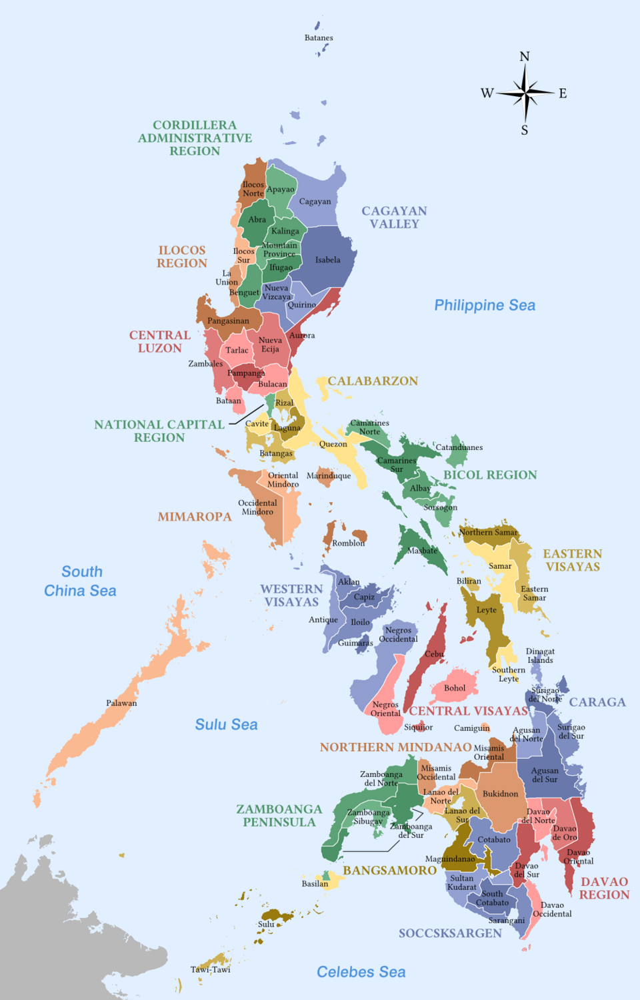

https://agora.ex.nii.ac.jp/digital-typhoon/ibtracs/WP/index.html.en
